# End-to-end Multi-class Dog Breed Classification

## 1. Problem

Identifying 120 breeds of dogs given images of dogs.

## 2. Data

The data we're suing is from Kaggle's dog breed identification [competition](https://www.kaggle.com/competitions/dog-breed-identification).

## 3. Evaluation

The evaluation is a file with prediction probablilites for each dog breed of each test image. The metric we use is Multi Class Log Loss (MCLL).

## 4. Features

* We're dealing with images so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs.
* There are around 10000+ images in the training set (with labels).
* There are around 1000+ images in the test set (without labels).

In [ ]:
# !unzip "/content/drive/MyDrive/Dog Vision/dog-breed-identification(1).zip" -d "/content/drive/MyDrive/Dog Vision/"

In [ ]:
pathname="/content/drive/MyDrive/Dog Vision/test/"

### Get our workspace ready

* Import Tensorflow 2.x ✅
* Import Tensorflow Hub
* Make sure we're using a GPU

In [7]:
# import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version: ", tf.__version__)
print("TF Hub version: ", hub.__version__)

# Check for GPU availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

TF version:  2.15.0
TF Hub version:  0.16.1
GPU available


## Getting our data ready (turning into Tensors)

Our data has to be in numerical format. We are turning our images into Tensors

In [8]:
# Checkout th labels of our data
import pandas as pd
labels_csv=pd.read_csv("/content/drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: >

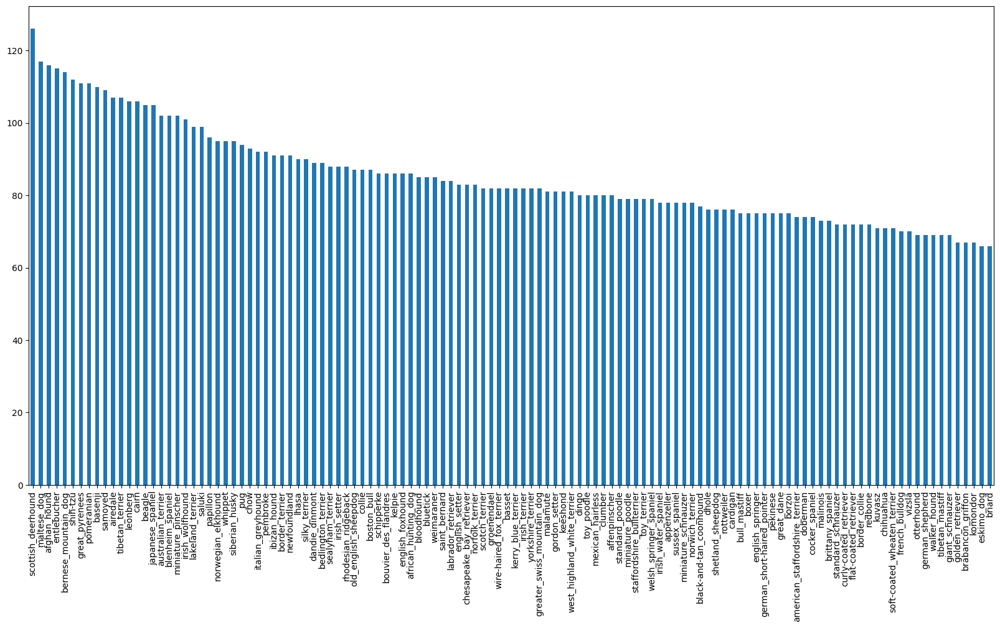

In [9]:
# How many images are the of each breed
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [10]:
labels_csv["breed"].value_counts().median()

82.0

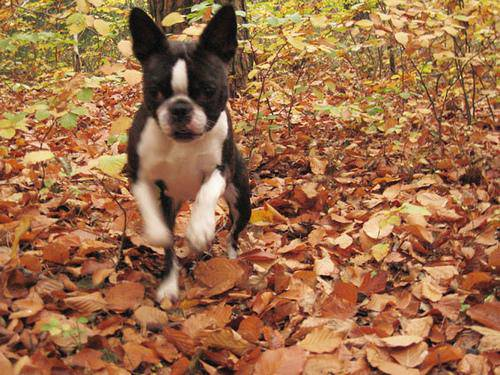

In [11]:
#let's view an image
from IPython.display import Image
Image("/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

### Getting images and their labels

Let's get a list of all of our image file pathnames.

In [12]:
labels_csv.head()


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [13]:
filenames= ["/content/drive/MyDrive/Dog Vision/train/" +
            fname for fname in labels_csv["id"] +
            ".jpg"]

filenames[:10]

['/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [14]:
len(filenames)

10222

In [15]:
import os
if len(os.listdir("/content/drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amout of files!!! Proceed.")
else:
  print("Nope")

Filenames match actual amout of files!!! Proceed.


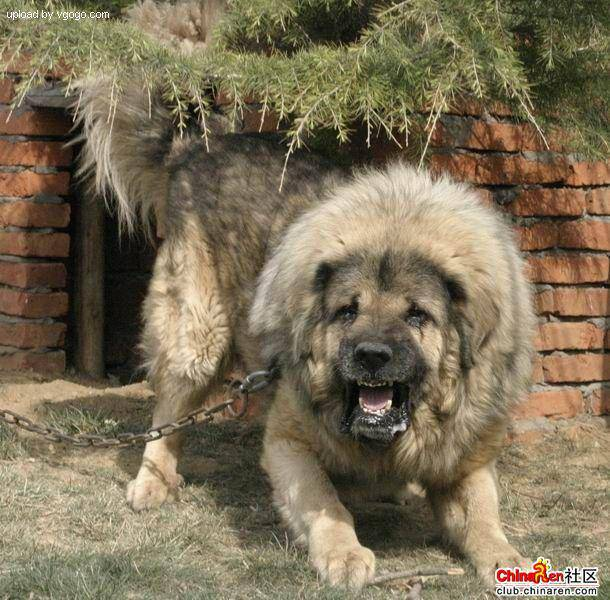

In [16]:
Image(filenames[9000])

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [17]:
import numpy as np
labels = np.array(labels_csv["breed"])
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [18]:
len(np.unique(labels))

120

In [19]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches the number of filenames!")
else:
  print("Number of labels does NOT match the number of filenames!")

Number of labels matches the number of filenames!


In [20]:
unique_breeds = np.unique(labels)

In [21]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [23]:
# Turn every label into a boolean array
boolean_labels=[label == unique_breeds for label in labels]

In [25]:
len(boolean_labels)

10222

### Creating our own validation set

In [24]:
# Setup X and y variables
X = filenames
y = boolean_labels

We're going to start off expereimenting with ~1000 images and increase as needed

In [26]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [27]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [29]:
X_train[:1], y_train[:1]

(['/content/drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, Fa

## Preprocessing Images (turning images into Tensors)

We're going to write a function which does a few things:
* Take an image filepath as input
* Use TensorFlow to read the file and save it to a variable, `image`
* Turn our `image` (a jpg) into Tensors
* Normalize our image (convert color channel values from 0-255 to 0-1).
* Resize the `image` to be a shape of (224,224)
* Return the modified `image`

In [31]:
# Convert an image to NumPy array
from matplotlib.pyplot import imread
image =imread(filenames[42])
image.shape

(257, 350, 3)

In [32]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def proccess_image(image_path):
  """
  Take an image file path and turn the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the JPEG image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colours channel from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224,224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

Why turn our data into batches?

Let's say you'retrying to proccess 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (batch size) images at a time.

In order ot use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this: `(image, label)`.

In [33]:
# Create a function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Take an image file path nam and the associated label,
  proccesses the image and returns a tuple of (image, label).
  """
  image=proccess_image(image_path)
  return image, label

In [34]:
# Demo of the above
get_image_label(X[42],y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form `(image, tuple)`, let's make a function to turn all of our data into batches!

In [35]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of image (X) and label(y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data s input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data= tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepathcs (no labels)
    data_batch = data.map(proccess_image).batch(BATCH_SIZE)

    return data_batch
  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)

    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepathc and labes into Tensors
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                           tf.constant(y)))
    #Shuffle pathnames and labels before mapping image processor function is faster than shuffling images.
    data=data.shuffle(buffer_size=(len(X)))

    # Create (image, label) tuples
    data=data.map(get_image_label)

    #Turn the training data into batches
    data_batch=data.batch(BATCH_SIZE)

    return data_batch




In [36]:
# Create traing and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


## Visualizing Data Batches

Our Data is in now batches, however, these can be a little hard to understand/comprehend, let's visualize them.

In [37]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  # Setup the firgure
  plt.figure(figsize=(10,10))
  #Loop through 25 images
  for i in range(25):
    # Create subplots
    ax=plt.subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [38]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

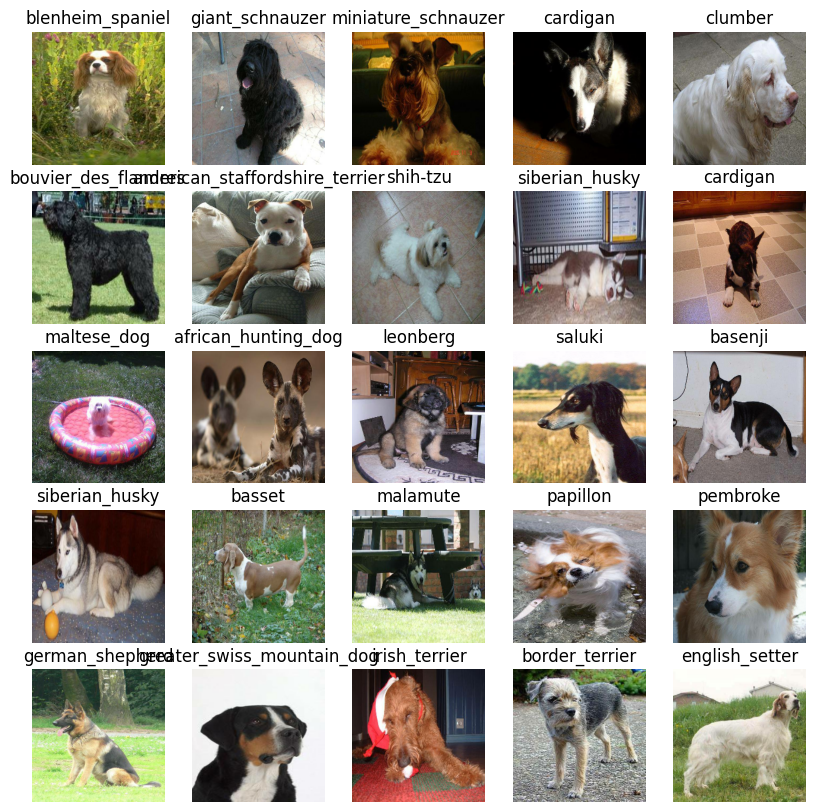

In [39]:
# Now let's visualize the data in training batch
show_25_images(train_images, train_labels)

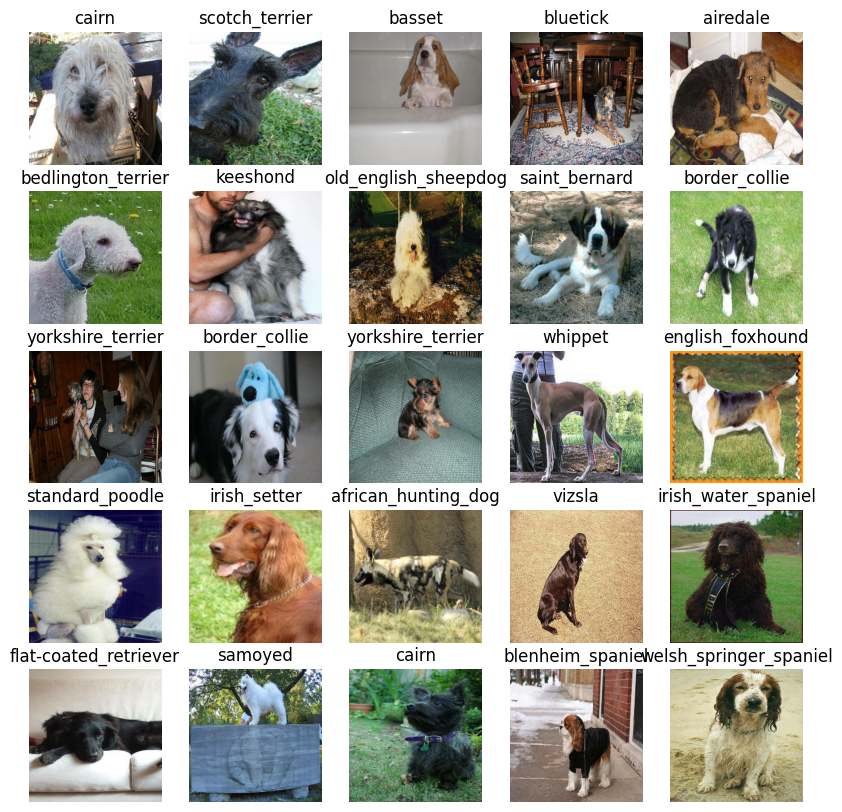

In [40]:
# Now let's visualize or validation set
val_images, val_labels=next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our image shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of th model we want to use.

In [41]:
# Setup input shape to the model
INPUT_SHAPE=[None, IMG_SIZE,IMG_SIZE, 3]

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

#Setup model URL from TensorFlow Hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/frameworks/tensorFlow2/variations/130-224-classification/versions/1"


Now we've got our inputs, outputs and model ready to go.
Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output and the model we've chosen as parameters.
* Defines the layers in a Keras Model in squential fashion (do this first, then that).
* Compile sthe model (says it should be evaluated and improved).
* Bulds the model (tells the model the input shape it'll be getting).
* Returns the model.

In [42]:
# Create a function which builds a Keras mdoel
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  #Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") # Layer 2 (output layer)
  ])
  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [43]:
model=create_model()
model.summary()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/tensorFlow2/variations/130-224-classification/versions/1
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [44]:
outputs=np.ones(shape=(1,1,1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'Ll create two callbacks, one for TensorBoard which helps track our models process and another for early stopping which prevents our model from training too long.

### TensorBoard callback

To setup up a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our model training logs with the `%tensorboard ` magic function.

In [45]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [46]:
import datetime

#Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log dictionary for storing TensorBoard logs
  logdir=os.path.join("/content/drive/MyDrive/Dog Vision/logs/",
                      # Make it so the logs get tracked whener we run an experiment
                      datetime.datetime.now().strftime("%Y%m%d-%H%S%S"))
  return tf.keras.callbacks.TensorBoard(logdir)


### Early Stopping callback

Early stopping helps stop our model from overfitting.

In [47]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on subset of data)

Our first model is going to train on 1000 images, to make sure everything is working.

In [48]:
NUM_EPOCHS = 10 #@param {type:"slider", min:10, max:100, step:10}

In [50]:
# Check to make sure we're still running a GPU
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epocs train for and callbacks we want to use.
* Return the model

In [51]:
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  #Create a model
  model= create_model()

  #Create a new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  #Return the fitted model
  return model

In [52]:
# Fit the model to the data
model = train_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/tensorFlow2/variations/130-224-classification/versions/1
Epoch 1/10
25/25 [==============================] - 13s 197ms/step - loss: 4.5811 - accuracy: 0.1100 - val_loss: 3.4698 - val_accuracy: 0.2550
Epoch 2/10
25/25 [==============================] - 5s 194ms/step - loss: 1.6325 - accuracy: 0.6650 - val_loss: 2.2246 - val_accuracy: 0.5100
Epoch 3/10
25/25 [==============================] - 4s 171ms/step - loss: 0.5627 - accuracy: 0.9488 - val_loss: 1.6923 - val_accuracy: 0.5800
Epoch 4/10
25/25 [==============================] - 4s 173ms/step - loss: 0.2540 - accuracy: 0.9875 - val_loss: 1.5044 - val_accuracy: 0.6100
Epoch 5/10
25/25 [==============================] - 5s 182ms/step - loss: 0.1464 - accuracy: 0.9975 - val_loss: 1.4489 - val_accuracy: 0.6150
Epoch 6/10
25/25 [==============================] - 4s 151ms/step - loss: 0.1008 - accuracy: 0.9987 - val_loss: 1.4085 - val_accuracy: 0.6250
Epoch 7/


**Question:** It looks like our model is overfitting. What are some way to prevent model overfitting in deep learning neural networks?

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [53]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [54]:
# Make predictions on the validation data (not used to train on)
predictions=model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 3s 172ms/step


array([[6.0592610e-03, 1.3338437e-04, 1.9466025e-03, ..., 2.8192668e-04,
        6.4924781e-05, 2.5498902e-03],
       [3.9205076e-03, 4.0912960e-04, 1.2588848e-02, ..., 6.7928835e-04,
        1.0940567e-02, 2.0208690e-04],
       [4.0114926e-05, 4.1030326e-05, 2.8442973e-05, ..., 7.0521884e-05,
        6.2533531e-05, 3.8897945e-04],
       ...,
       [1.2711712e-05, 2.3723571e-05, 5.1364099e-05, ..., 2.4537660e-05,
        2.7677839e-04, 1.2775415e-04],
       [4.5222985e-03, 2.7078830e-04, 2.5070398e-04, ..., 1.7397484e-04,
        3.7858853e-04, 3.7637737e-02],
       [2.2328216e-04, 5.9871330e-05, 1.2186823e-03, ..., 5.9577664e-03,
        3.0718575e-04, 7.1780873e-05]], dtype=float32)

In [55]:
predictions.shape

(200, 120)

In [56]:
len(y_val)

200

In [59]:
index=12
print(f"Max value (probability of prediction): {np.max(predictions[index]):.2f}")
print("Predicted label:",unique_breeds[predictions[index].argmax()])
print("Actual label:",unique_breeds[y_val[index]][0])

Max value (probability of prediction): 0.54
Predicted label: yorkshire_terrier
Actual label: yorkshire_terrier


**Note:** Prediction probabilites are also known as confidence levels.

In [61]:
# Turn prediction probabilites into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of probablilites into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

#Example
pred_label = get_pred_label(predictions[12])
pred_label

'yorkshire_terrier'

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those prediction to the vlidation labels (truth labels).

In [62]:
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separete images and labels.
  """
  images_ = []
  labels_ = []

  #Loop through unbatched data
  for image, label in val_data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(unique_breeds[np.argmax(label)])
  return images_, labels_

#Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [63]:
# Let's visualize
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and iamge for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color  of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  #Change plot title

  plt.title("The {} is {:2.0f}% {}".format(pred_label,
                                   np.max(pred_prob*100),
                                    true_label),
                                    color = color)

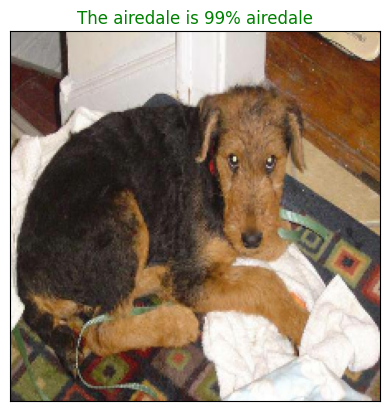

In [64]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=4)

Let's make a function to view our model's top 10 predictions.

In [65]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediction confidences along with the truth label for sampel n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 highest pred
  top_10_pred_indices = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidenve values
  top_10_pred_values = pred_prob[top_10_pred_indices]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indices]

  #Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  #Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass



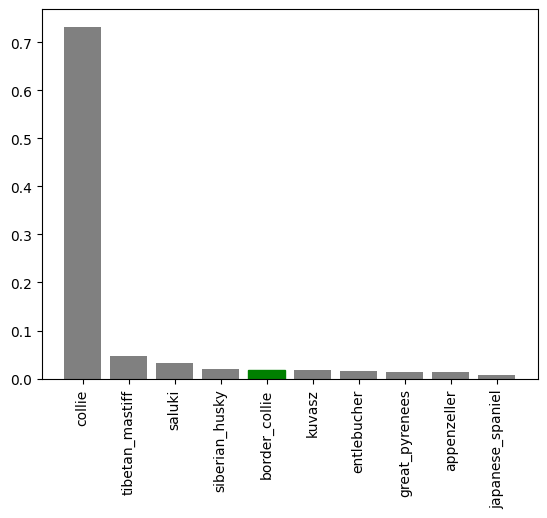

In [66]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some function to help us visualize our predictions and evaluate our model, let's check out.

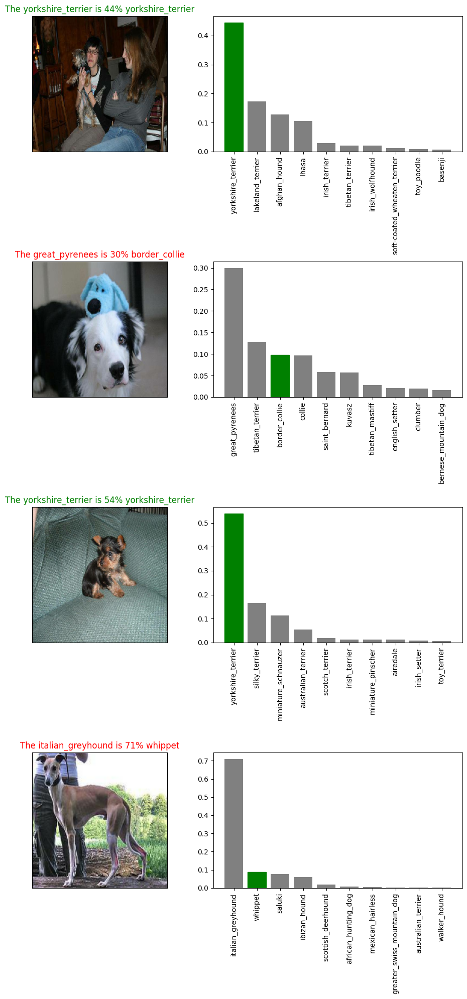

In [67]:
i_multiplier = 10
num_rows=4
num_cols =1
num_images =num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
  plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model

In [68]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  modeldir=os.path.join("drive/My Drive/Dog Vision/models",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" #save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [69]:
# Create a function to load a model
def load_model(model_path):
  """
  Loads a saved model from a models directory and appends a suffix (string).
  """
  print(f"Loading models from: {model_path}...")
  model=tf.keras.models.load_model(model_path,
                                   custom_objects={"KerasLayer": hub.KerasLayer})
  return model

In [70]:
#Let's test the save and load functions
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20240209-09301707471034-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/Dog Vision/models/20240209-09301707471034-1000-images-mobilenetv2-Adam.h5'

In [71]:
# Load a trained model
loaded_1000_image_model=load_model("drive/My Drive/Dog Vision/models/20240209-09301707471034-1000-images-mobilenetv2-Adam.h5")

Loading models from: drive/My Drive/Dog Vision/models/20240209-09301707471034-1000-images-mobilenetv2-Adam.h5...


In [72]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 96ms/step - loss: 1.3151 - accuracy: 0.6450


[1.3150683641433716, 0.6449999809265137]

In [73]:
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 95ms/step - loss: 1.3151 - accuracy: 0.6450


[1.3150683641433716, 0.6449999809265137]

## Training a big dog model (on the full data)

In [74]:
full_data = create_data_batches(X, y)

Creating training data batches...


In [75]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [76]:
full_model=create_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/tensorFlow2/variations/130-224-classification/versions/1


In [78]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when traing on all the data so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=5)

**Note:** Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [79]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=100,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 51s 147ms/step - loss: 1.3490 - accuracy: 0.6681
Epoch 2/100
320/320 [==============================] - 47s 148ms/step - loss: 0.4031 - accuracy: 0.8827
Epoch 3/100
320/320 [==============================] - 43s 135ms/step - loss: 0.2367 - accuracy: 0.9340
Epoch 4/100
320/320 [==============================] - 42s 132ms/step - loss: 0.1549 - accuracy: 0.9616
Epoch 5/100
320/320 [==============================] - 42s 130ms/step - loss: 0.1044 - accuracy: 0.9793
Epoch 6/100
320/320 [==============================] - 41s 129ms/step - loss: 0.0757 - accuracy: 0.9877
Epoch 7/100
320/320 [==============================] - 41s 129ms/step - loss: 0.0588 - accuracy: 0.9920
Epoch 8/100
320/320 [==============================] - 41s 128ms/step - loss: 0.0458 - accuracy: 0.9948
Epoch 9/100
320/320 [==============================] - 43s 133ms/step - loss: 0.0370 - accuracy: 0.9959
Epoch 10/100
320/320 [==============================] - 42s 132m

In [81]:
save_model(full_model, suffix="full-model-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20240209-09551707472535-full-model-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/models/20240209-09551707472535-full-model-mobilenetv2-Adam.h5'

In [82]:
loaded_full_model = load_model("drive/My Drive/Dog Vision/models/20240209-09551707472535-full-model-mobilenetv2-Adam.h5")

Loading models from: drive/My Drive/Dog Vision/models/20240209-09551707472535-full-model-mobilenetv2-Adam.h5...


## Making predictions on the dataset

In [83]:
test_path="drive/My Drive/Dog Vision/test/"
test_filenames = [test_path +fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/My Drive/Dog Vision/test/000621fb3cbb32d8935728e48679680e.jpg',
 'drive/My Drive/Dog Vision/test/00102ee9d8eb90812350685311fe5890.jpg',
 'drive/My Drive/Dog Vision/test/0012a730dfa437f5f3613fb75efcd4ce.jpg',
 'drive/My Drive/Dog Vision/test/001510bc8570bbeee98c8d80c8a95ec1.jpg',
 'drive/My Drive/Dog Vision/test/001a5f3114548acdefa3d4da05474c2e.jpg',
 'drive/My Drive/Dog Vision/test/00225dcd3e4d2410dd53239f95c0352f.jpg',
 'drive/My Drive/Dog Vision/test/002c2a3117c2193b4d26400ce431eebd.jpg',
 'drive/My Drive/Dog Vision/test/002c58d413a521ae8d1a5daeb35fc803.jpg',
 'drive/My Drive/Dog Vision/test/002f80396f1e3db687c5932d7978b196.jpg',
 'drive/My Drive/Dog Vision/test/0036c6bcec6031be9e62a257b1c3c442.jpg']

In [84]:
len(test_filenames)

10357

In [85]:
#Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)


Creating test data batches...


In [86]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing it the test data batch with take a long time to run.

In [87]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 155s 477ms/step


In [88]:
# Save predictions
np.savetxt("drive/My Drive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [89]:
# Load predictions
test_predictions=np.loadtxt("drive/My Drive/Dog Vision/preds_array.csv", delimiter=",")

In [90]:
test_predictions[:2]

array([[7.34183200e-12, 4.37889308e-12, 8.62382624e-15, 5.18467884e-14,
        5.22817365e-14, 1.21363978e-11, 1.31039835e-16, 9.94771106e-13,
        1.55218733e-13, 2.92873642e-11, 4.73985534e-15, 1.87960997e-12,
        2.57998782e-13, 9.16875642e-09, 3.24746062e-14, 4.59965887e-13,
        6.77136231e-14, 1.20575913e-13, 2.16407933e-11, 1.82424909e-12,
        3.91517390e-15, 2.21262852e-11, 3.55881991e-12, 2.90151509e-14,
        2.07360062e-13, 9.83754952e-11, 2.31095769e-13, 3.56994873e-16,
        2.02193520e-15, 7.12040062e-12, 7.23236087e-13, 5.56015574e-13,
        2.67856158e-12, 2.65301919e-10, 2.85328978e-15, 2.02503727e-16,
        6.19147799e-13, 3.22320295e-14, 1.75284727e-13, 9.60655733e-09,
        2.41771945e-12, 2.87038188e-14, 4.86455982e-13, 1.49209428e-14,
        3.52699879e-12, 1.55277013e-10, 2.43800585e-13, 3.68787596e-12,
        1.20347872e-11, 2.15164843e-12, 1.30493056e-13, 5.79689899e-12,
        1.87421242e-11, 8.85966444e-14, 1.85447946e-12, 5.778443

In [91]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

In [92]:
preds_df=pd.DataFrame(columns=["id"]+list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [93]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0]for path in os.listdir(test_path)]
preds_df["id"]=test_ids

In [94]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,00102ee9d8eb90812350685311fe5890,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0012a730dfa437f5f3613fb75efcd4ce,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,001510bc8570bbeee98c8d80c8a95ec1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,001a5f3114548acdefa3d4da05474c2e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [95]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,7.341832e-12,4.378893e-12,8.623826e-15,5.184679e-14,5.228174e-14,1.213640e-11,1.310398e-16,9.947711e-13,1.552187e-13,...,4.138487e-13,9.423313e-14,1.399590e-14,2.289886e-15,8.407972e-15,7.501169e-13,5.781779e-13,2.023029e-13,1.001306e-09,4.563747e-11
1,00102ee9d8eb90812350685311fe5890,5.706661e-07,5.789026e-07,9.958860e-09,1.017839e-09,9.967174e-07,1.527425e-08,1.172687e-06,6.046014e-07,3.028062e-08,...,1.446109e-08,3.342472e-07,4.354872e-09,3.522288e-06,4.664404e-08,5.787941e-08,1.889031e-04,1.656036e-11,9.148814e-08,7.354791e-10
2,0012a730dfa437f5f3613fb75efcd4ce,1.840878e-11,1.875358e-07,8.322540e-10,4.600807e-11,1.149089e-11,8.804567e-10,1.617751e-12,8.932567e-13,1.017828e-09,...,3.504535e-13,1.866005e-12,7.484542e-08,8.885304e-07,3.928925e-08,2.716394e-08,1.776913e-13,8.993879e-08,5.553124e-12,4.167523e-12
3,001510bc8570bbeee98c8d80c8a95ec1,4.298903e-09,1.292763e-08,1.173517e-07,3.306662e-07,1.481451e-06,1.185366e-07,4.778098e-12,3.635629e-09,4.683645e-08,...,2.644517e-07,4.188900e-11,6.329844e-08,5.627032e-09,3.710294e-08,1.448328e-10,1.382764e-16,1.915660e-03,1.586586e-11,1.728167e-08
4,001a5f3114548acdefa3d4da05474c2e,4.925510e-04,5.641886e-06,2.898758e-09,2.645441e-10,1.695976e-09,3.413398e-12,1.094924e-10,1.576797e-09,9.221005e-09,...,9.872738e-08,1.669954e-11,4.899972e-11,1.463020e-11,3.281784e-10,3.568362e-10,1.193508e-11,7.599304e-08,2.593868e-10,4.996661e-08


In [96]:
# Save our predictions dataframe to CSV for Kaggle submission
preds_df.to_csv("drive/My Drive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

## Making predictions for real

In [97]:
# Get the custom image filepaths
custom_path = "drive/My Drive/Dog Vision/my_dogs/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [98]:
custom_image_paths

['drive/My Drive/Dog Vision/my_dogs/Névtelen.jpg',
 'drive/My Drive/Dog Vision/my_dogs/Kuvasz_named_Kan.jpg',
 'drive/My Drive/Dog Vision/my_dogs/Standard-Dachshund.jpg']

In [100]:
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [101]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 2s 2s/step


In [102]:
custom_preds.shape

(3, 120)

In [103]:
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['pembroke', 'kuvasz', 'black-and-tan_coonhound']

In [104]:
custom_images = []
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)


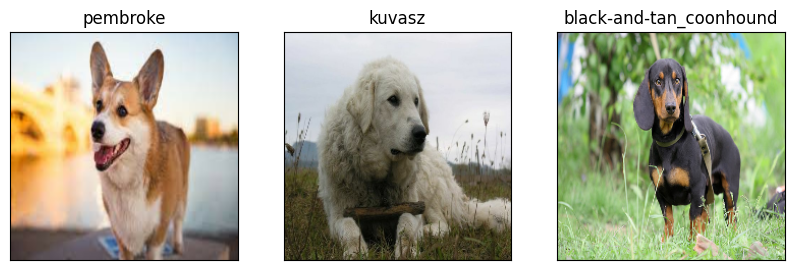

In [105]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)

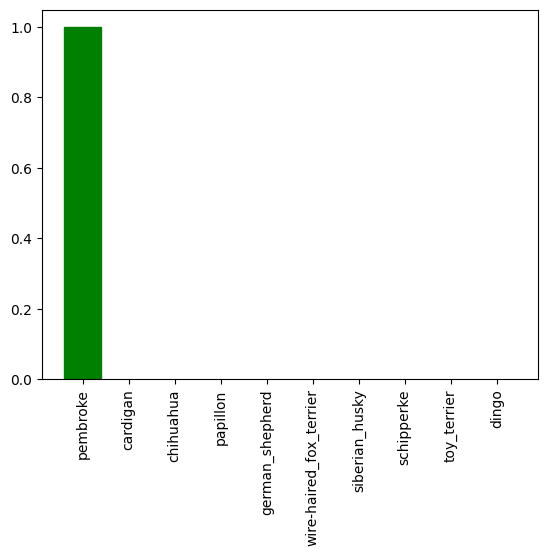

In [106]:
plot_pred_conf(prediction_probabilities=custom_preds, labels=custom_pred_labels, n=0)

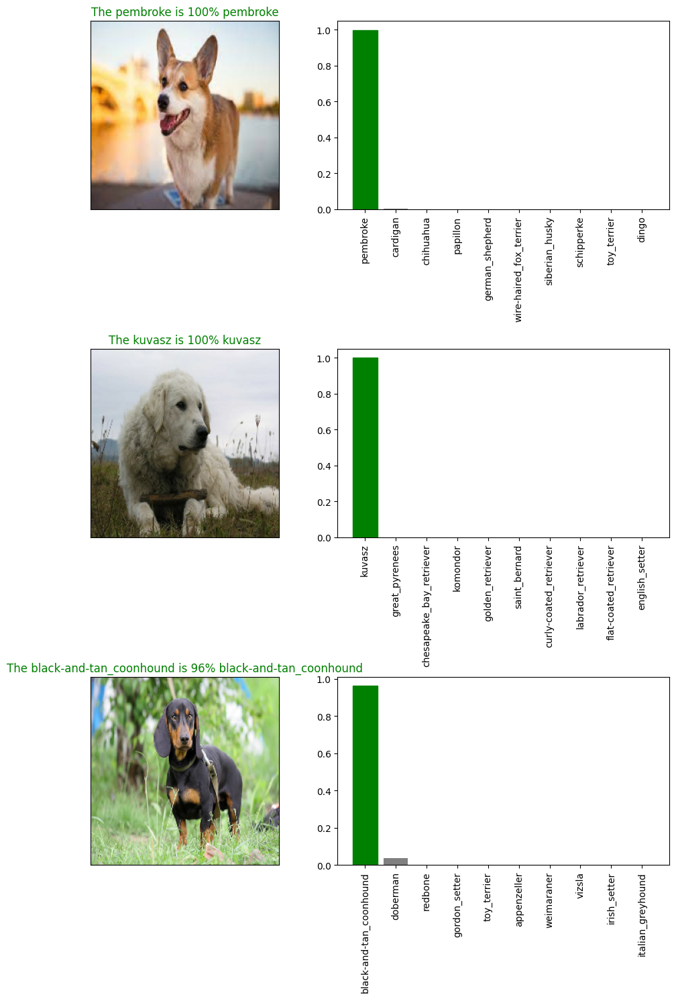

In [107]:
i_multiplier = 0
num_rows=len(custom_preds)
num_cols =1
num_images =num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=custom_preds,
            labels=custom_pred_labels,
            images=custom_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=custom_preds,
                 labels=custom_pred_labels,
                 n=i+i_multiplier)
  plt.tight_layout(h_pad=1.0)
plt.show()